In [ ]:
#!pip install scikit-plot

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from imblearn.datasets import make_imbalance
from collections import defaultdict
from yellowbrick.contrib.classifier import DecisionViz
from sklearn.decomposition import PCA
from itertools import product
from yellowbrick.datasets import load_credit
from yellowbrick.features import PCA as yPCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score 
from scikitplot.metrics import plot_precision_recall, plot_roc, plot_cumulative_gain, plot_lift_curve
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import KFold
from sklearn import tree
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, f1_score, classification_report

datasets

In [ ]:
df_train = pd.read_csv("/content/Train_NOoutliers")
df_train = df_train.drop(columns=['Unnamed: 0'], axis = 1)
df_train = df_train.drop(columns=['outlier_detection'], axis = 1)
df_test = pd.read_csv("/content/Test_ripulito")
df_test = df_test.drop(columns=['Unnamed: 0'], axis = 1)

In [ ]:
df_train_final = df_train[(df_train.emotion != "neutral") & (df_train.emotion != "surprised")]
df_test_final = df_test[(df_test.emotion != "neutral") & (df_test.emotion != "surprised")]

In [ ]:
train_positive = []
for value in df_train_final['emotion']:
  if((value == 'happy') | (value == 'calm')):
    train_positive.append(1)
  else:
    train_positive.append(0)

In [ ]:
test_positive = []
for value in df_test_final['emotion']:
  if((value == 'happy') | (value == 'calm')):
    test_positive.append(1)
  else:
    test_positive.append(0)

In [ ]:
df_train_final = df_train_final.assign(positive = train_positive)
df_test_final = df_test_final.assign(positive = test_positive)
#1 se emozioni positive 
#0 se emozioni negative
#neutral e surprised NON incluse

In [ ]:
X_train = df_train_final.drop(columns=['vocal_channel', 'emotion', 'emotional_intensity', 'statement', 'repetition', 'sex', 'filename','positive'], axis = 1)
y_train = df_train_final[['positive']]
X_test = df_test_final.drop(columns=['vocal_channel', 'emotion', 'emotional_intensity', 'statement', 'repetition', 'sex', 'filename','positive'], axis = 1)
y_test = df_test_final[['positive']]

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# make sure data are np.ndarray
y_train = np.array(y_train)
X_train = np.array(X_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

Funzioni utili

In [ ]:
def result_pred(y_true, y_pred):
    print("**** Matrice di Confusione *****")
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    print(' True negative: %d False negative: %d' % (tn, fn))
    print(' True positive: %d False positive: %d' % (tp, fp))
    print("____________________________________________")

    # Calcolo dell'accuracy
    print("***** Calcolo dell'accuracy *****")
    accuracy = accuracy_score(y_true, y_pred)    
    print('Frazione di campioni correttamente correlati: %0.4f' % accuracy)
    accuracy = accuracy_score(y_true, y_pred)
    print("Numero di campioni correttamente correlati: ", accuracy)    
    print("____________________________________________")

    # Calcolo della precision
    print("**** Calcolo della precisione *****")
    #Percentuale di classificazioni positive che sono corrette
    #se dico "positivo" dico giusto?
    precision = precision_score(y_true, y_pred)
    print('Percentuale di classificazioni positive che sono corrette: %0.4f' % precision)   
    print("____________________________________________")    

    # Calcolo della recall
    print("**** Calcolo della recall (sensitivity) *****")
    recall = recall_score(y_true, y_pred)
    print('Percentuale di elementi positivi del testing set che sono stati classificati come positivi: %0.4f' % recall)
    print("____________________________________________")    

    # Calcolo della specificity
    print("**** Calcolo della specificity *****")
    specificity = tn / (tn+fp)
    print('Percentuale di elementi negativi del testing set che sono stati classificati come negativi: %0.4f' % specificity)
    print("____________________________________________")   
    
    # Calcolo dell'F1 score
    print("**** Calcolo della F1 score *****")
    f1 = f1_score(y_true, y_pred)
    #Il punteggio F1 può essere interpretato come una media ponderata della precisione e della recall, 
    #in cui un punteggio F1 raggiunge il suo valore migliore a 1 e il punteggio peggiore a 0.
    print('F1 scores: %0.4f' % f1)
    print("____________________________________________")   
    
    # Stampiamo le stesse statistiche dalla funzione report
    print(classification_report(y_test, y_pred))
    
    print("Con le tecniche viste finora non viene fornita nessuna informazione sulla “gravità” degli errori (“errore lieve” oppure “errore grave)")
    print("per questo si usano la curva CMC, la curva ROC")

In [ ]:
# Prima di chiamare questa funzione dobbiamo aver
# scritto in y_pred il valore di ".predict" che come output fornirà 0 o 1
# dentro a y_score il valore di ".predict_proba" che darà solo la probabilità di 1
def plot_res(y_pred, y_score, y_test):
    #ROC CURVE: implementazione legata esclusivamente all'attività di classificazione binaria
    #false positive rate, true positive rate
    print("****** ROC CURVE + AUC?: passo passo *******")
    fprate, tprate, threashold = roc_curve(y_test, y_score[:, 1])
    auc_score = auc(fprate, tprate)
    plt.plot(fprate, tprate, color='darkorange', lw=3, label='$AUC_0$ = %.3f' % (auc_score))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC curve', fontsize=16)
    plt.legend(loc="lower right", fontsize=14, frameon=False)
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.show()

    print("____________________________________")
    print("****** VALORE DI AUC *******")    
    print(roc_auc_score(y_test, y_score[:,1]))    
    
    print("____________________________________")
    print("****** ROC CURVE: con metodo diretto *******")
    plot_roc(y_test, y_score)
    plt.show()
    
    print("____________________________________")
    print("****** Precision recall: con metodo diretto *******")
    plot_precision_recall(y_test, y_score)
    plt.show()
    

    print("____________________________________")
    print("****** Cumulative gain: con metodo diretto *******")
    plot_cumulative_gain(y_test, y_score)
    plt.show()
    
    
    print("____________________________________")
    print("****** Lift curve: con metodo diretto *******")    
    plot_lift_curve(y_test, y_score)
    plt.show()

In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

ENSEMBLE METHODS

AdaBoost

In [ ]:
# Set the parameters by cross-validation
tuned_parameters = {
    'n_estimators': [5, 10, 25, 50, 100],
    'learning_rate' : [0.1, 0.25, 0.5, 0.75, 1],
 }

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    obj = AdaBoostClassifier(GaussianNB())
    
    clf = GridSearchCV(obj, tuned_parameters, cv=5, scoring=score)
   
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'learning_rate': 0.1, 'n_estimators': 10}

Grid scores on development set:

0.414 (+/-0.046) for {'learning_rate': 0.1, 'n_estimators': 5}
0.460 (+/-0.051) for {'learning_rate': 0.1, 'n_estimators': 10}
0.427 (+/-0.023) for {'learning_rate': 0.1, 'n_estimators': 25}
0.451 (+/-0.051) for {'learning_rate': 0.1, 'n_estimators': 50}
0.449 (+/-0.041) for {'learning_rate': 0.1, 'n_estimators': 100}
0.403 (+/-0.057) for {'learning_rate': 0.25, 'n_estimators': 5}
0.383 (+/-0.166) for {'learning_rate': 0.25, 'n_estimators': 10}
0.403 (+/-0.111) for {'learning_rate': 0.25, 'n_estimators': 25}
0.384 (+/-0.053) for {'learning_rate': 0.25, 'n_estimators': 50}
0.411 (+/-0.071) for {'learning_rate': 0.25, 'n_estimators': 100}
0.384 (+/-0.075) for {'learning_rate': 0.5, 'n_estimators': 5}
0.348 (+/-0.119) for {'learning_rate': 0.5, 'n_estimators': 10}
0.417 (+/-0.074) for {'learning_rate': 0.5, 'n_estimators

**** Matrice di Confusione *****
 True negative: 288 False negative: 139
 True positive: 53 False positive: 48
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6458
Numero di campioni correttamente correlati:  0.6458333333333334
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.5248
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.2760
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.8571
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.3618
____________________________________________
              precision    recall

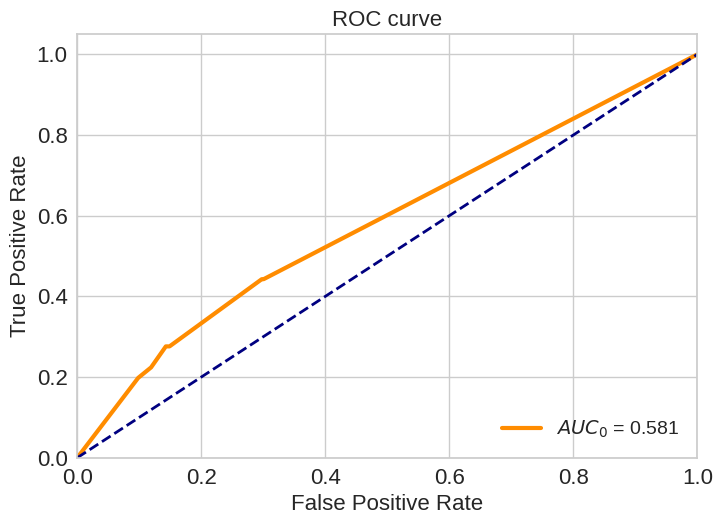

____________________________________
****** VALORE DI AUC *******
0.5809926835317459
____________________________________
****** ROC CURVE: con metodo diretto *******


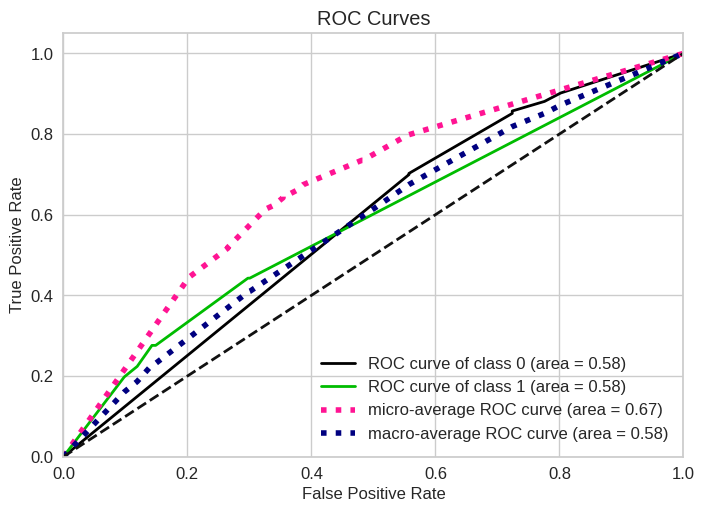

____________________________________
****** Precision recall: con metodo diretto *******


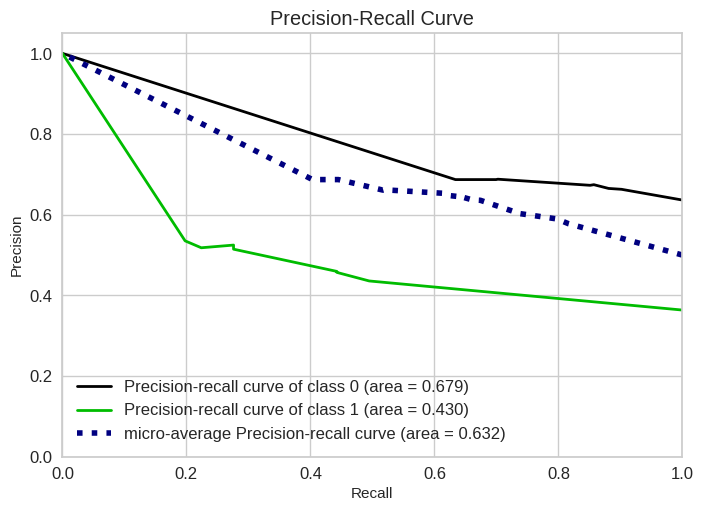

____________________________________
****** Cumulative gain: con metodo diretto *******


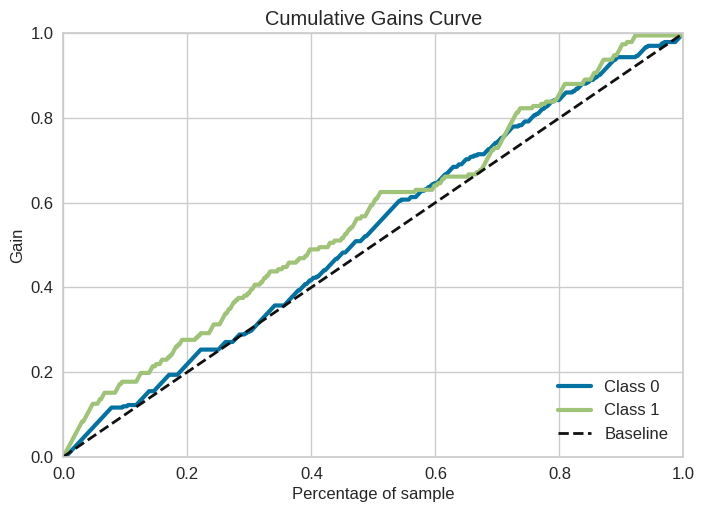

____________________________________
****** Lift curve: con metodo diretto *******


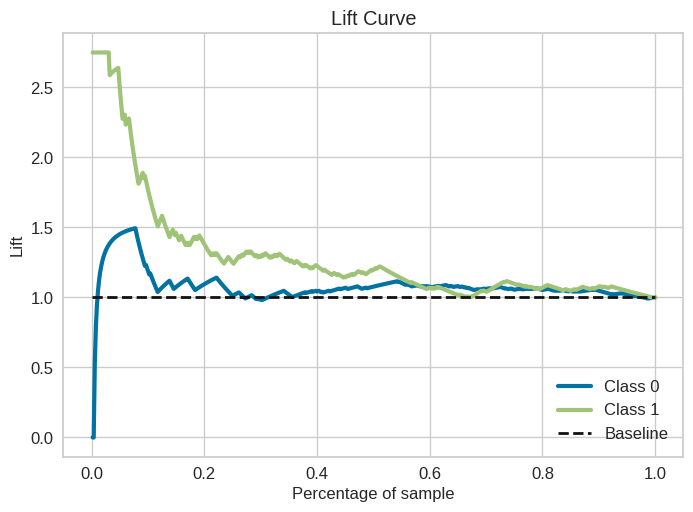

In [ ]:
clf = AdaBoostClassifier(learning_rate= 0.1, n_estimators= 5)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

In [ ]:
feature_names = df_train_final.columns

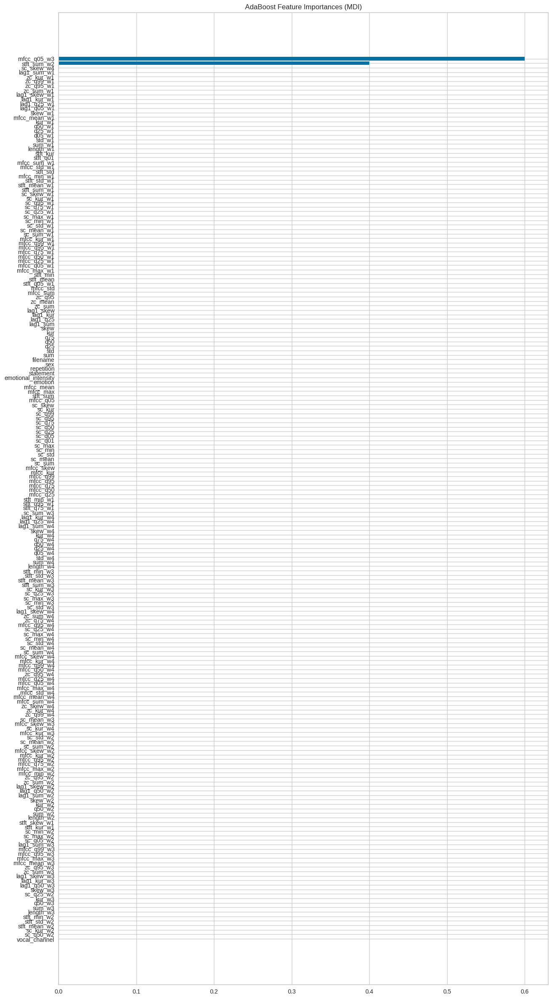

In [ ]:
nbr_features = 205
tree_feature_importances = clf.feature_importances_
sorted_idx = tree_feature_importances.argsort()[-nbr_features:]

y_ticks = np.arange(0, len(sorted_idx))
fig, ax = plt.subplots(figsize=(15,30))
plt.barh(y_ticks, tree_feature_importances[sorted_idx])
plt.yticks(y_ticks, np.array(feature_names)[sorted_idx])
plt.title("AdaBoost Feature Importances (MDI)")
plt.show()

Bagging

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

bagging con gaussian

In [ ]:
# Set the parameters by cross-validation
param_grid = {
    'max_features' : [1, 2, 3, 4],
    'max_samples' : [0.05, 0.02, 0.01, 0.1, 0.2, 0.5, 1.0],
    'n_estimators': [1, 5, 10, 25, 50, 100]
}

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    clf = GridSearchCV(BaggingClassifier(GaussianNB()), param_grid, scoring = score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'max_features': 3, 'max_samples': 0.02, 'n_estimators': 50}

Grid scores on development set:

0.203 (+/-0.537) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 1}
0.318 (+/-0.821) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 5}
0.160 (+/-0.640) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 10}
0.141 (+/-0.565) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 25}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 50}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 100}
0.160 (+/-0.401) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 1}
0.256 (+/-0.288) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 5}
0.389 (+/-0.744) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 10}
0.200 (+/-0.800) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators'

**** Matrice di Confusione *****
 True negative: 284 False negative: 141
 True positive: 51 False positive: 52
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6345
Numero di campioni correttamente correlati:  0.634469696969697
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.4951
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.2656
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.8452
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.3458
____________________________________________
              precision    recall 

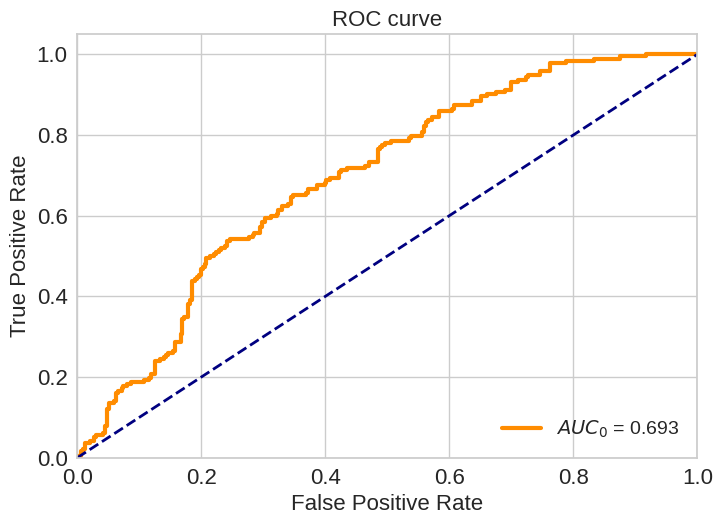

____________________________________
****** VALORE DI AUC *******
0.6933903769841271
____________________________________
****** ROC CURVE: con metodo diretto *******


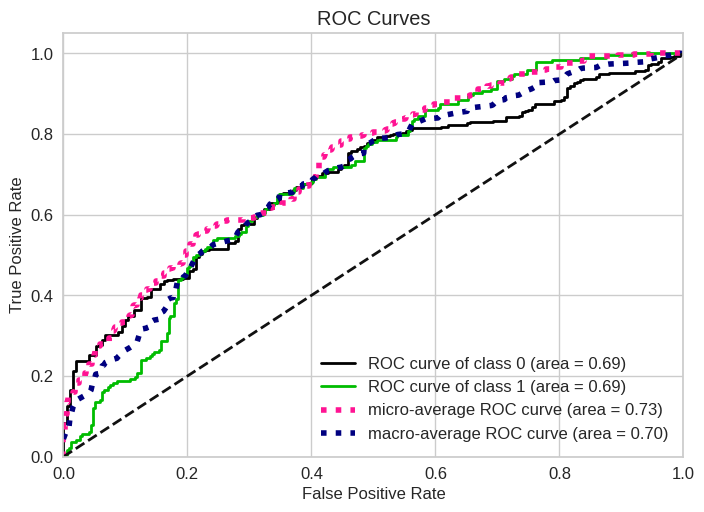

____________________________________
****** Precision recall: con metodo diretto *******


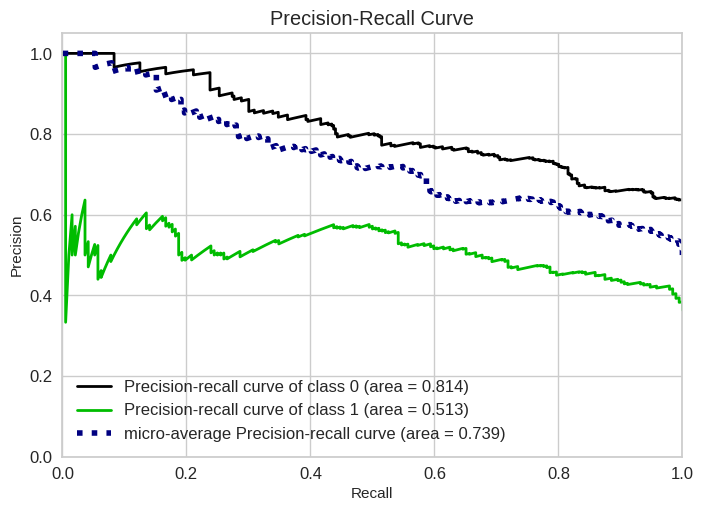

____________________________________
****** Cumulative gain: con metodo diretto *******


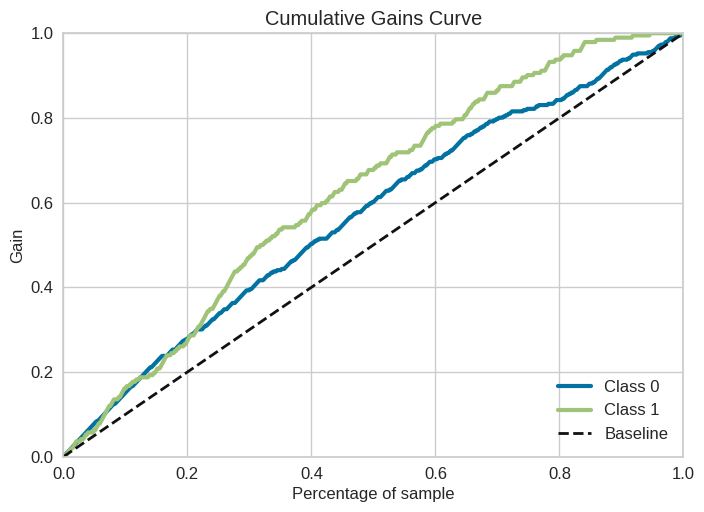

____________________________________
****** Lift curve: con metodo diretto *******


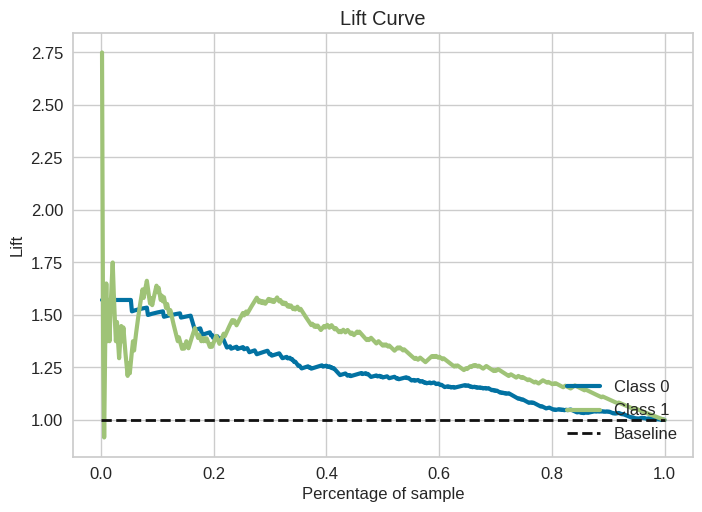

In [ ]:
#{'max_features': 4, 'max_samples': 0.5, 'n_estimators': 100}
clf = BaggingClassifier(GaussianNB(), max_features = 4, max_samples = 0.5, n_estimators = 100)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Bagging Decision Tree

In [ ]:
# Set the parameters by cross-validation
param_grid = {
    'max_features' : [1, 2, 3, 4],
    'max_samples' : [0.05, 0.02, 0.01, 0.1, 0.2, 0.5, 1.0],
    'n_estimators': [1, 5, 10, 25, 50, 100]
}

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    clf = GridSearchCV(BaggingClassifier(DecisionTreeClassifier(criterion='gini', max_depth= 5, min_samples_leaf= 5, min_samples_split= 5)), param_grid, scoring = score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'max_features': 4, 'max_samples': 0.05, 'n_estimators': 50}

Grid scores on development set:

0.350 (+/-0.164) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 1}
0.379 (+/-0.124) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 5}
0.481 (+/-0.292) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 10}
0.280 (+/-0.784) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 25}
0.200 (+/-0.800) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 50}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 100}
0.215 (+/-0.357) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 1}
0.469 (+/-0.111) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 5}
0.196 (+/-0.359) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 10}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators'

**** Matrice di Confusione *****
 True negative: 329 False negative: 181
 True positive: 11 False positive: 7
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6439
Numero di campioni correttamente correlati:  0.6439393939393939
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.6111
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.0573
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.9792
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.1048
____________________________________________
              precision    recall 

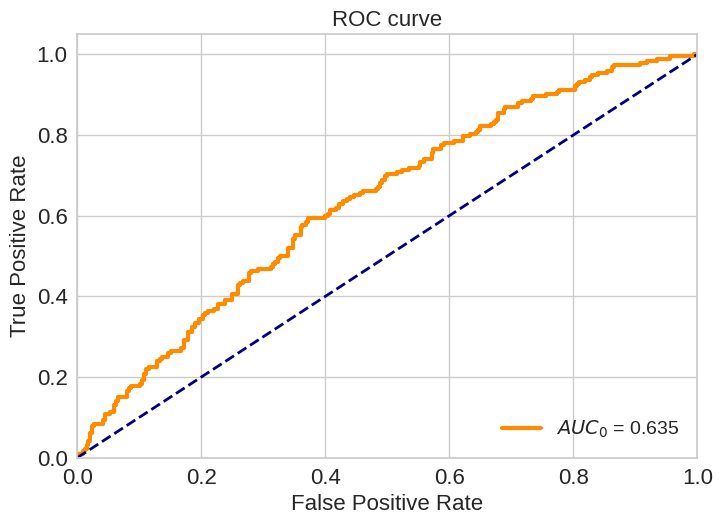

____________________________________
****** VALORE DI AUC *******
0.634827628968254
____________________________________
****** ROC CURVE: con metodo diretto *******


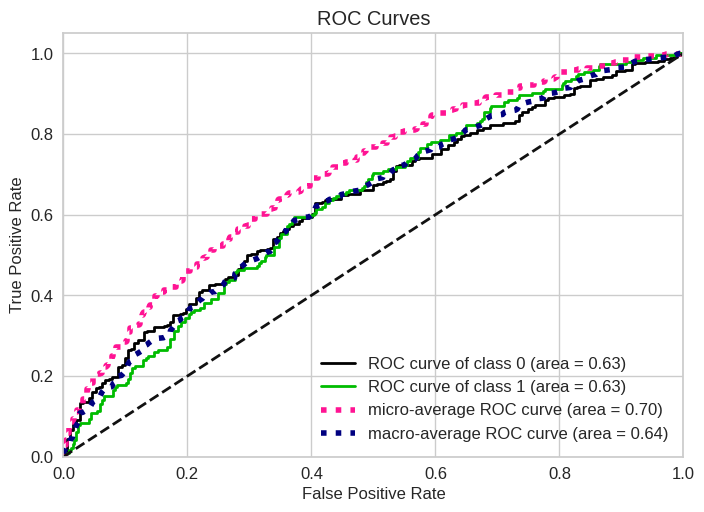

____________________________________
****** Precision recall: con metodo diretto *******


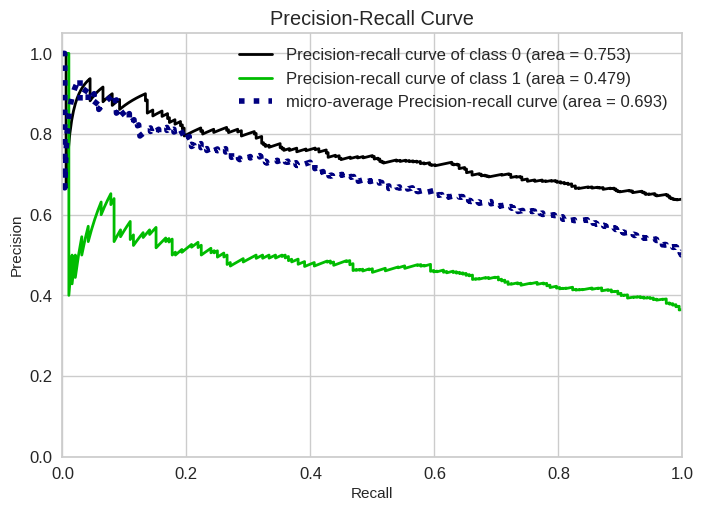

____________________________________
****** Cumulative gain: con metodo diretto *******


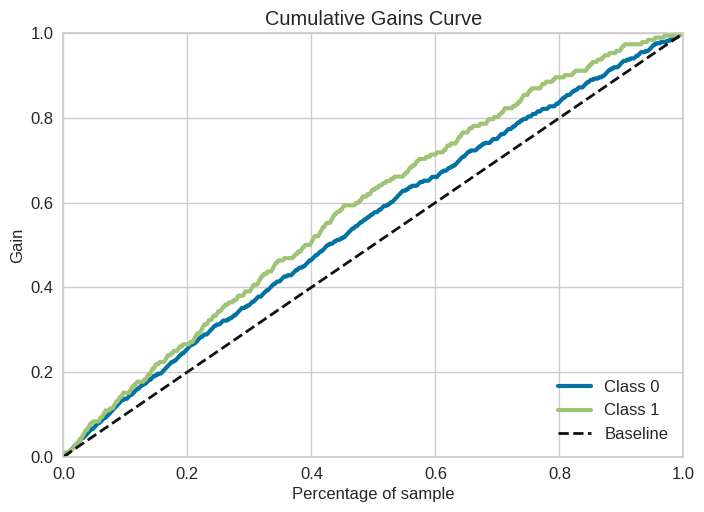

____________________________________
****** Lift curve: con metodo diretto *******


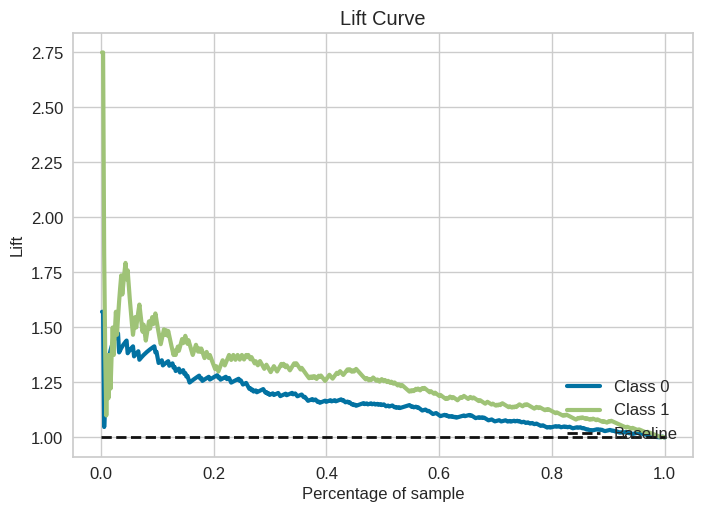

In [ ]:
#{'max_features': 4, 'max_samples': 0.05, 'n_estimators': 50}
clf = BaggingClassifier(DecisionTreeClassifier(criterion='gini', max_depth= 5, min_samples_leaf= 5, min_samples_split= 5), max_features = 4, max_samples = 0.05, n_estimators = 50)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Bagging KNN

In [ ]:
# Set the parameters by cross-validation
param_grid = {
    'max_features' : [1, 2, 3, 4],
    'max_samples' : [0.05, 0.02, 0.01, 0.1, 0.2, 0.5, 1.0],
    'n_estimators': [1, 5, 10, 25, 50, 100]
}

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    clf = GridSearchCV(BaggingClassifier(KNeighborsClassifier()), param_grid, scoring = score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'max_features': 2, 'max_samples': 1.0, 'n_estimators': 50}

Grid scores on development set:

0.369 (+/-0.106) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 1}
0.382 (+/-0.413) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 5}
0.465 (+/-0.669) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 10}
0.133 (+/-0.533) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 25}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 50}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 100}
0.542 (+/-0.483) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 1}
0.352 (+/-0.152) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 5}
0.288 (+/-0.478) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 10}
0.092 (+/-0.369) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators':

**** Matrice di Confusione *****
 True negative: 331 False negative: 188
 True positive: 4 False positive: 5
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6345
Numero di campioni correttamente correlati:  0.634469696969697
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.4444
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.0208
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.9851
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.0398
____________________________________________
              precision    recall  f

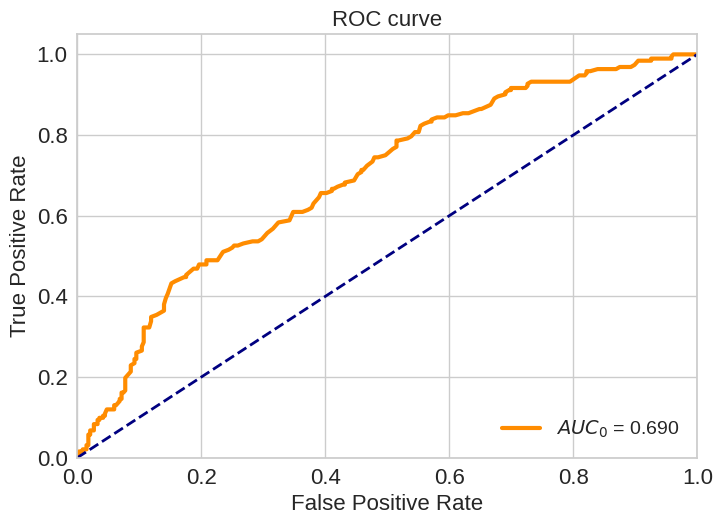

____________________________________
****** VALORE DI AUC *******
0.6904684399801587
____________________________________
****** ROC CURVE: con metodo diretto *******


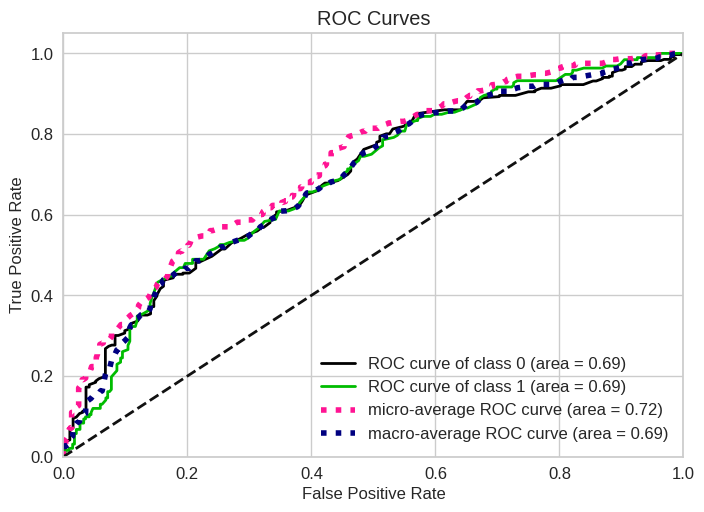

____________________________________
****** Precision recall: con metodo diretto *******


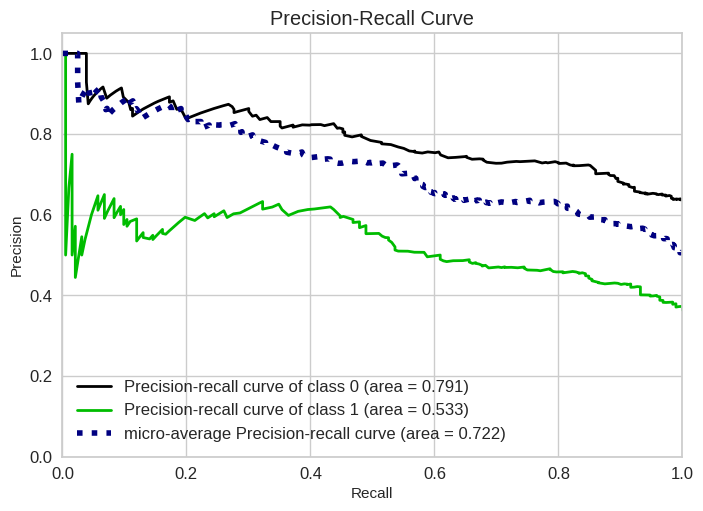

____________________________________
****** Cumulative gain: con metodo diretto *******


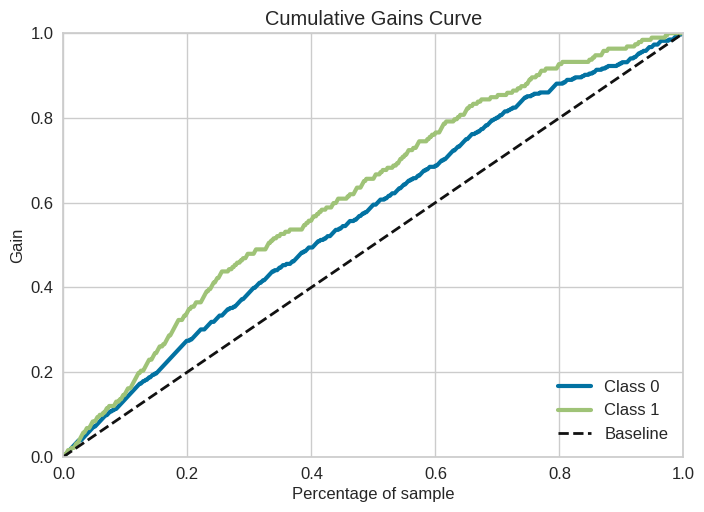

____________________________________
****** Lift curve: con metodo diretto *******


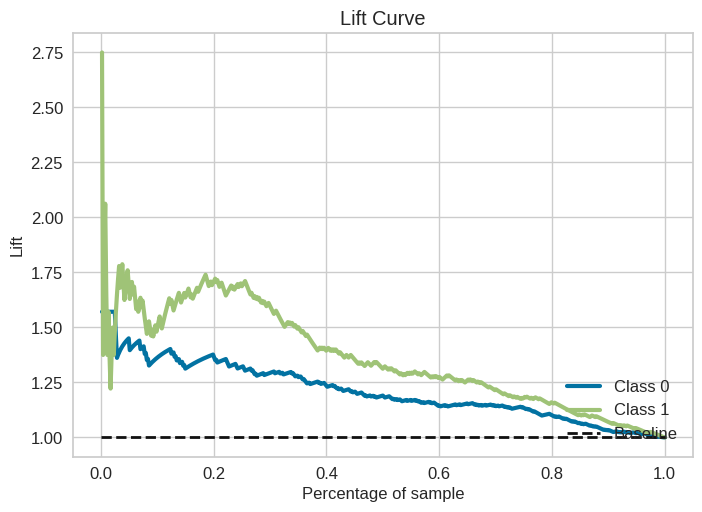

In [ ]:
#{'max_features': 4, 'max_samples': 0.2, 'n_estimators': 50} con accuracy
clf = BaggingClassifier(KNeighborsClassifier(), max_features = 4, max_samples = 0.2, n_estimators = 50)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Bagging - logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression
# Set the parameters by cross-validation
param_grid = {
    'max_features' : [1, 2, 3, 4],
    'max_samples' : [0.05, 0.02, 0.01, 0.1, 0.2, 0.5, 1.0],
    'n_estimators': [1, 5, 10, 25, 50, 100]
}

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    clf = GridSearchCV(BaggingClassifier(LogisticRegression()), param_grid, scoring = score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'max_features': 4, 'max_samples': 0.05, 'n_estimators': 5}

Grid scores on development set:

0.246 (+/-0.407) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 1}
0.268 (+/-0.671) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 5}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 10}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 25}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 50}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 100}
0.310 (+/-0.541) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 1}
0.240 (+/-0.588) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 5}
0.100 (+/-0.400) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 10}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators':

**** Matrice di Confusione *****
 True negative: 332 False negative: 192
 True positive: 0 False positive: 4
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6288
Numero di campioni correttamente correlati:  0.6287878787878788
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.0000
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.0000
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.9881
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.0000
____________________________________________
              precision    recall  

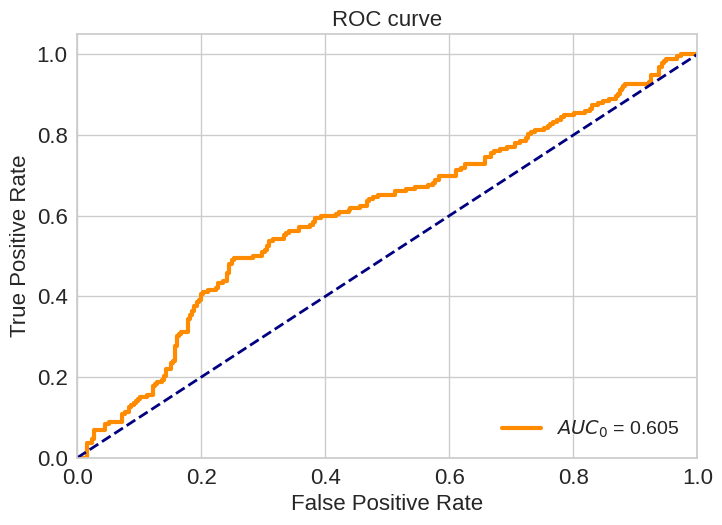

____________________________________
****** VALORE DI AUC *******
0.605406746031746
____________________________________
****** ROC CURVE: con metodo diretto *******


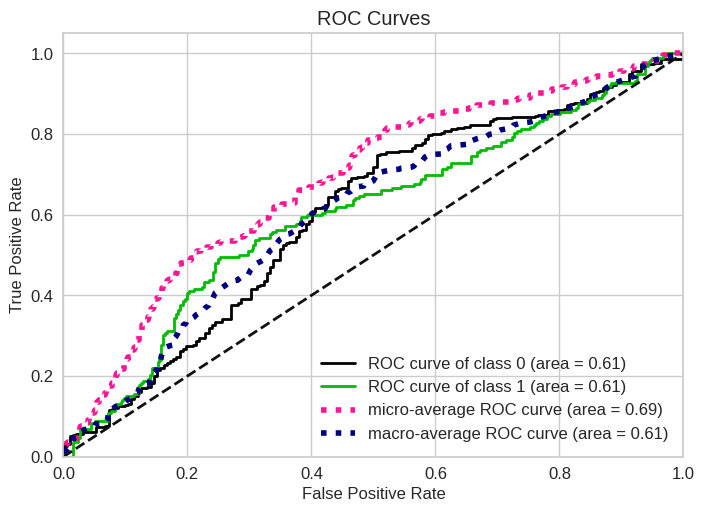

____________________________________
****** Precision recall: con metodo diretto *******


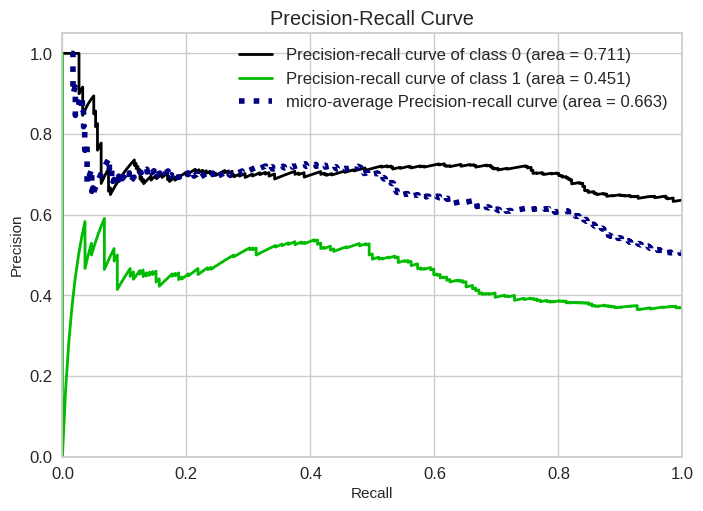

____________________________________
****** Cumulative gain: con metodo diretto *******


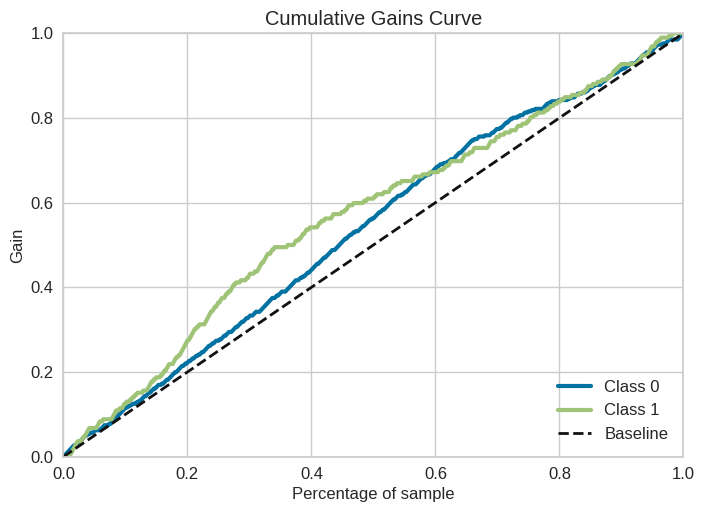

____________________________________
****** Lift curve: con metodo diretto *******


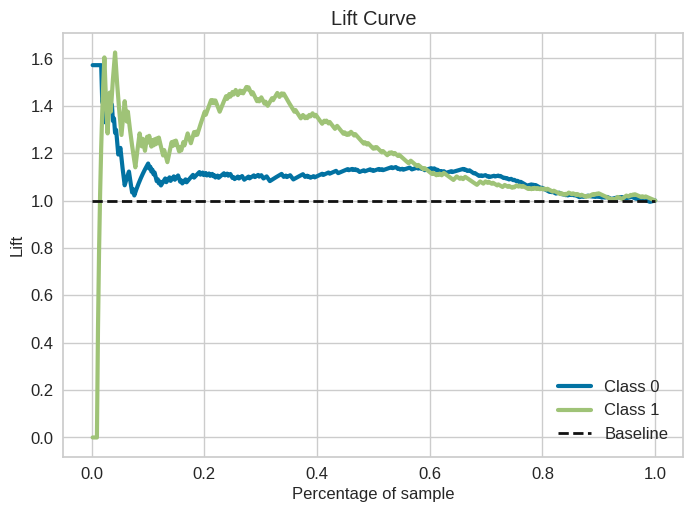

In [ ]:
#{'max_features': 4, 'max_samples': 0.02, 'n_estimators': 1} --> con la recall
clf = BaggingClassifier(LogisticRegression(), max_features = 4, max_samples = 0.02, n_estimators = 1)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Bagging con nessun estimator

In [ ]:
clf = BaggingClassifier(base_estimator=None, n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.7007575757575758
F1-score [0.77932961 0.53529412]
              precision    recall  f1-score   support

           0       0.73      0.83      0.78       336
           1       0.61      0.47      0.54       192

    accuracy                           0.70       528
   macro avg       0.67      0.65      0.66       528
weighted avg       0.69      0.70      0.69       528



**** Matrice di Confusione *****
 True negative: 279 False negative: 101
 True positive: 91 False positive: 57
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.7008
Numero di campioni correttamente correlati:  0.7007575757575758
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.6149
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.4740
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.8304
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.5353
____________________________________________
              precision    recall

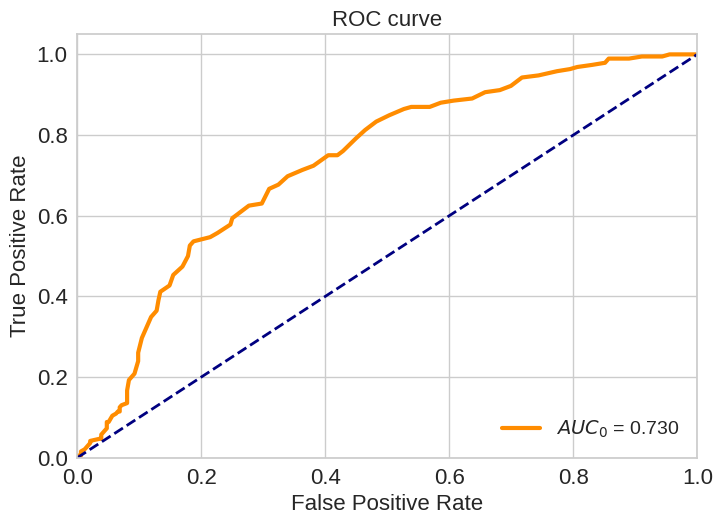

____________________________________
****** VALORE DI AUC *******
0.730437748015873
____________________________________
****** ROC CURVE: con metodo diretto *******


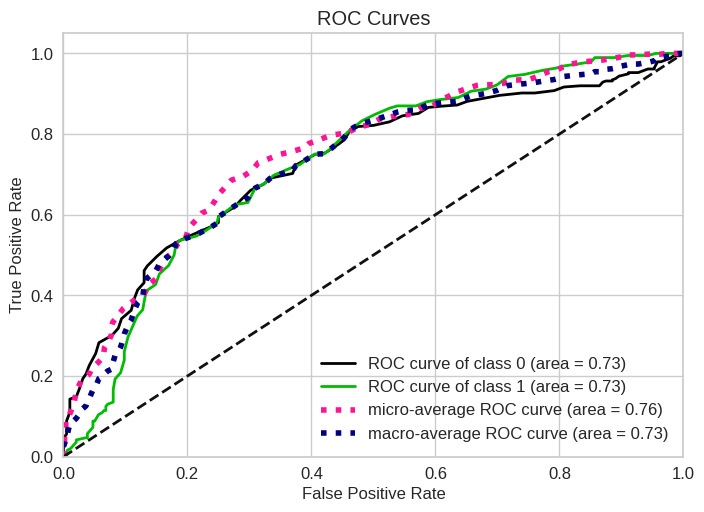

____________________________________
****** Precision recall: con metodo diretto *******


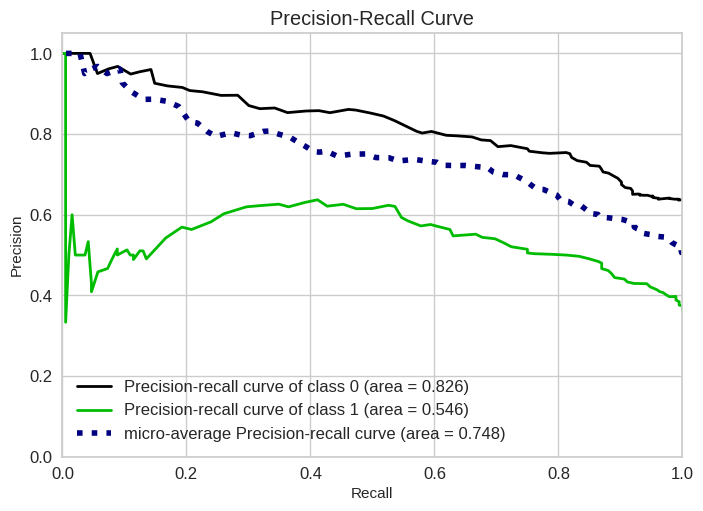

____________________________________
****** Cumulative gain: con metodo diretto *******


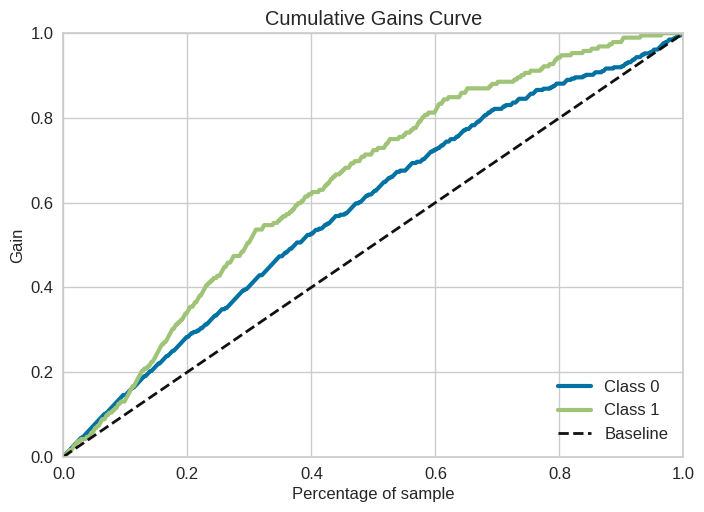

____________________________________
****** Lift curve: con metodo diretto *******


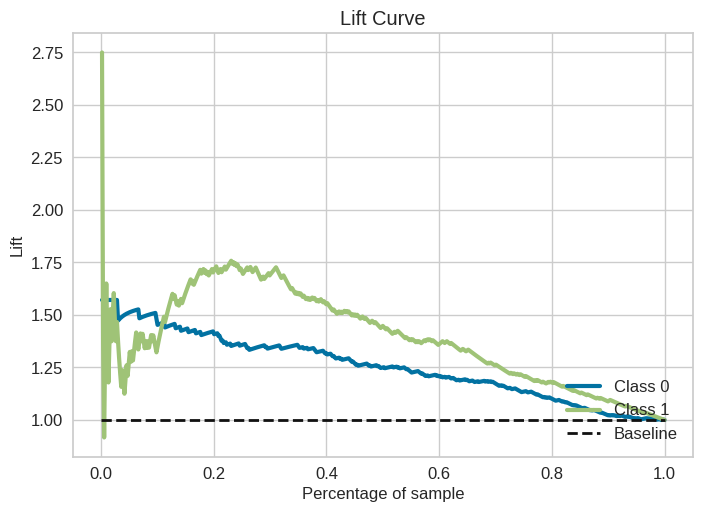

In [ ]:
clf = BaggingClassifier(base_estimator=None, n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Bagging con SVC

In [ ]:
from sklearn.linear_model import LogisticRegression
# Set the parameters by cross-validation
param_grid = {
    'max_features' : [1, 2, 3, 4],
    'max_samples' : [0.05, 0.02, 0.01, 0.1, 0.2, 0.5, 1.0],
    'n_estimators': [1, 5, 10, 25, 50, 100]
}

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    clf = GridSearchCV(BaggingClassifier(SVC(C=1000)), param_grid, scoring = score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'max_features': 4, 'max_samples': 0.1, 'n_estimators': 100}

Grid scores on development set:

0.305 (+/-0.258) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 1}
0.203 (+/-0.511) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 5}
0.200 (+/-0.800) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 10}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 25}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 50}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 100}
0.204 (+/-0.333) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 1}
0.376 (+/-0.403) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 5}
0.323 (+/-0.333) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 10}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators'

In [ ]:
clf = BaggingClassifier(base_estimator=SVC(C=1000), n_estimators=10, max_features=4, max_samples=0.1, random_state=42)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.6287878787878788
F1-score [0.76328502 0.14035088]
              precision    recall  f1-score   support

           0       0.64      0.94      0.76       336
           1       0.44      0.08      0.14       192

    accuracy                           0.63       528
   macro avg       0.54      0.51      0.45       528
weighted avg       0.57      0.63      0.54       528



**** Matrice di Confusione *****
 True negative: 316 False negative: 176
 True positive: 16 False positive: 20
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6288
Numero di campioni correttamente correlati:  0.6287878787878788
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.4444
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.0833
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.9405
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.1404
____________________________________________
              precision    recall

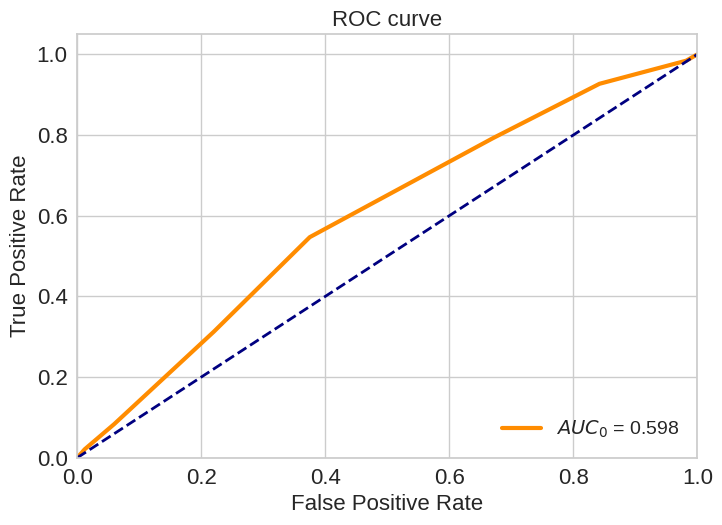

____________________________________
****** VALORE DI AUC *******
0.5978577628968255
____________________________________
****** ROC CURVE: con metodo diretto *******


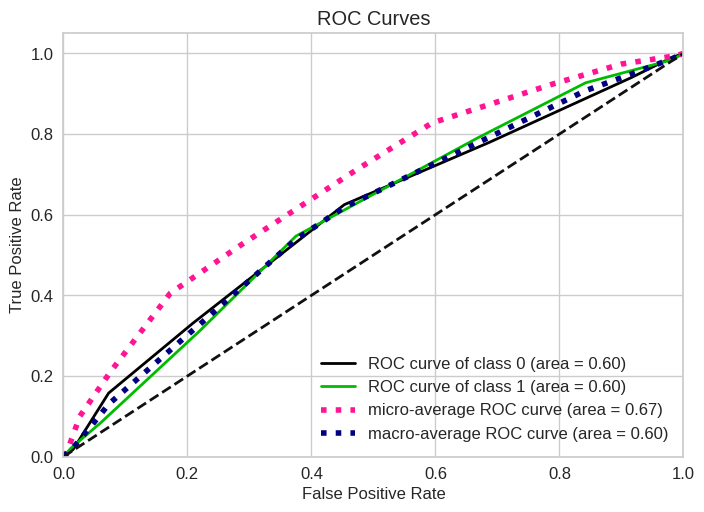

____________________________________
****** Precision recall: con metodo diretto *******


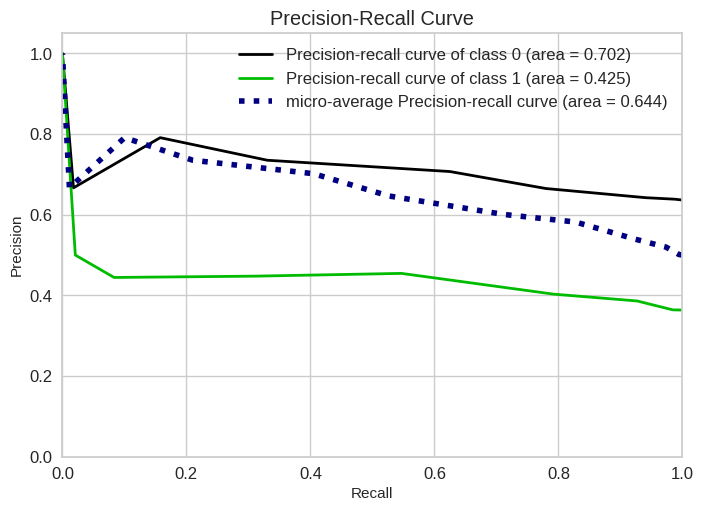

____________________________________
****** Cumulative gain: con metodo diretto *******


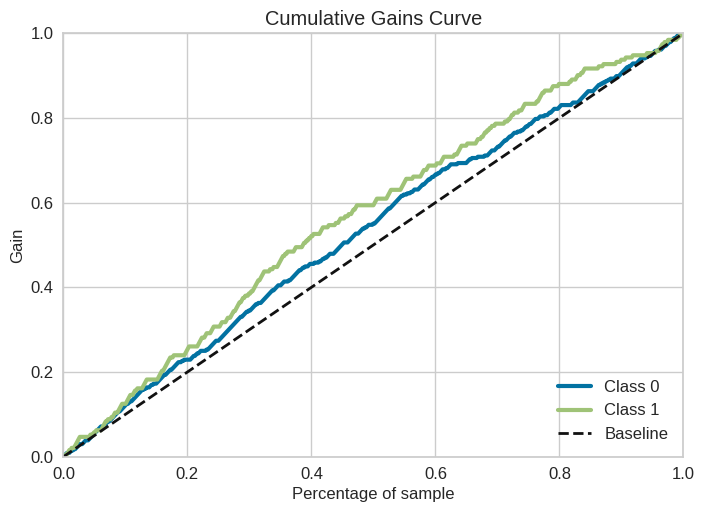

____________________________________
****** Lift curve: con metodo diretto *******


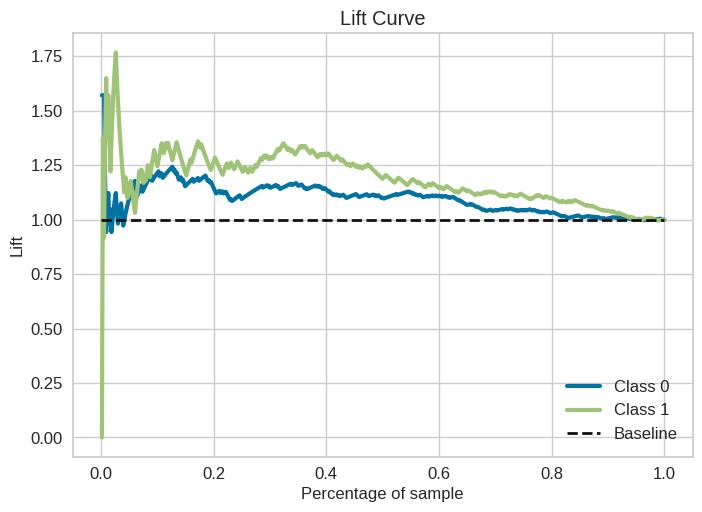

In [ ]:
clf = BaggingClassifier(base_estimator=SVC(C=1000), n_estimators=10, max_features=4, max_samples=0.1, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Bagging con RandomForest

In [ ]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

In [ ]:
# Set the parameters by cross-validation
param_grid = {
    'max_features' : [1, 2, 3, 4],
    'max_samples' : [0.05, 0.02, 0.01, 0.1, 0.2, 0.5, 1.0],
    'n_estimators': [1, 5, 10, 25, 50, 100]
}

scores = ['precision', 'recall', 'f1', 'accuracy']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    clf = GridSearchCV(BaggingClassifier(RandomForestClassifier(n_estimators=100)), param_grid, scoring = score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> precision

Best parameters set found on development set:

{'max_features': 4, 'max_samples': 0.1, 'n_estimators': 50}

Grid scores on development set:

0.391 (+/-0.078) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 1}
0.425 (+/-0.148) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 5}
0.476 (+/-0.546) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 10}
0.575 (+/-0.429) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 25}
0.133 (+/-0.533) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 50}
0.000 (+/-0.000) for {'max_features': 1, 'max_samples': 0.05, 'n_estimators': 100}
0.381 (+/-0.102) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 1}
0.409 (+/-0.103) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 5}
0.417 (+/-0.320) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators': 10}
0.377 (+/-0.208) for {'max_features': 1, 'max_samples': 0.02, 'n_estimators':

In [ ]:
#{'max_features': 4, 'max_samples': 0.1, 'n_estimators': 5}
clf = BaggingClassifier(base_estimator=RandomForestClassifier(n_estimators=100), max_features = 4, max_samples = 0.1, n_estimators=5, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.6306818181818182
F1-score [0.76758045 0.10138249]
              precision    recall  f1-score   support

           0       0.64      0.96      0.77       336
           1       0.44      0.06      0.10       192

    accuracy                           0.63       528
   macro avg       0.54      0.51      0.43       528
weighted avg       0.57      0.63      0.53       528



**** Matrice di Confusione *****
 True negative: 322 False negative: 181
 True positive: 11 False positive: 14
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6307
Numero di campioni correttamente correlati:  0.6306818181818182
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.4400
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.0573
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.9583
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.1014
____________________________________________
              precision    recall

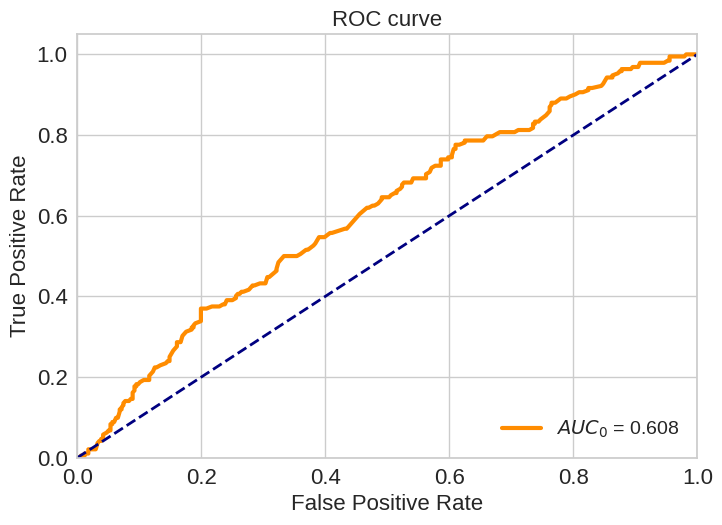

____________________________________
****** VALORE DI AUC *******
0.6081349206349206
____________________________________
****** ROC CURVE: con metodo diretto *******


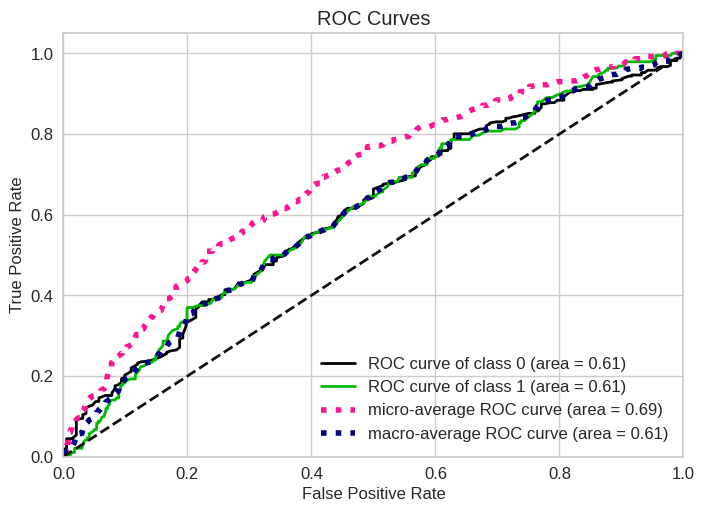

____________________________________
****** Precision recall: con metodo diretto *******


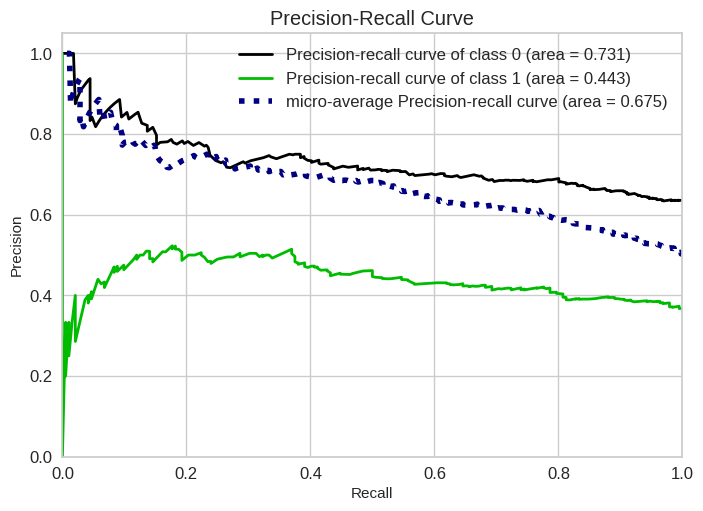

____________________________________
****** Cumulative gain: con metodo diretto *******


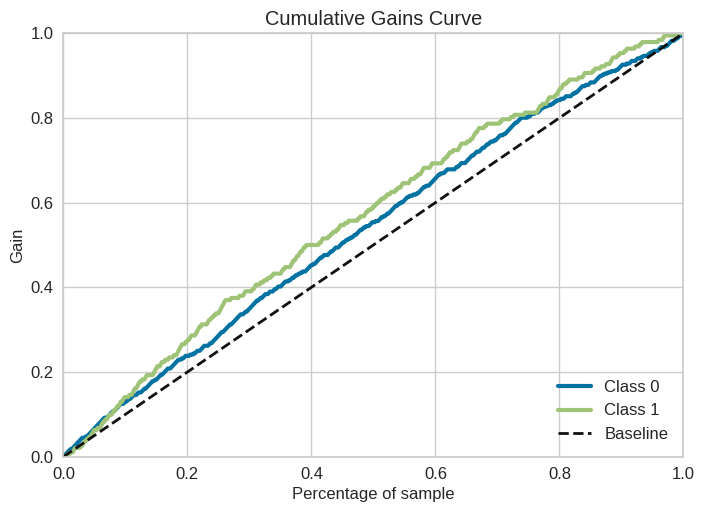

____________________________________
****** Lift curve: con metodo diretto *******


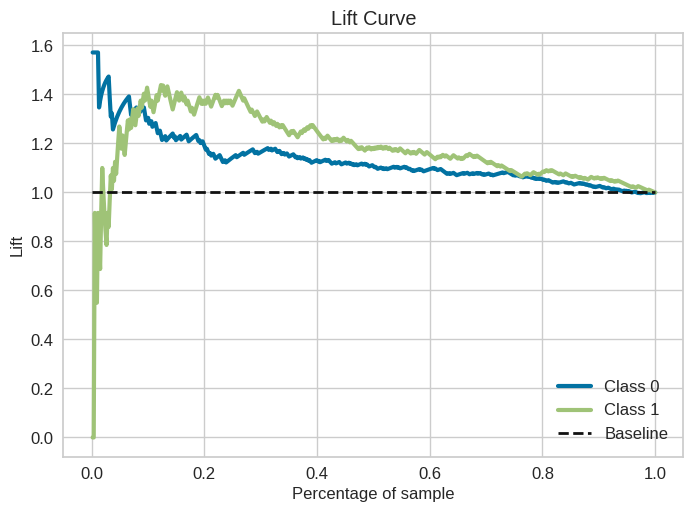

In [ ]:
clf = BaggingClassifier(base_estimator=RandomForestClassifier(n_estimators=100), max_features = 4, max_samples = 0.1, n_estimators=5, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

In [20]:
# Set the parameters by cross-validation
tuned_parameters = {
    'criterion' : ['gini', 'entropy'],
    'max_depth': [None, 10, 11, 15, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 5, 10, 20],
    'n_estimators': [25, 50, 75, 100,  200, 500, 1000]
}
#scores = ['precision', 'recall', 'f1']
scores = ['accuracy', 'f1']

for score in scores:
    print("# Tuning hyper-parameters for ----> %s" % score)
    print()
    
    obj = RandomForestClassifier()
    
    clf = GridSearchCV(obj, tuned_parameters, cv=5, scoring=score)

    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for ----> accuracy

Best parameters set found on development set:

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}

Grid scores on development set:

0.678 (+/-0.036) for {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 25}
0.670 (+/-0.043) for {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
0.682 (+/-0.017) for {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 75}
0.675 (+/-0.022) for {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
0.676 (+/-0.031) for {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
0.683 (+/-0.026) for {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimat

KeyboardInterrupt: ignored

**** Matrice di Confusione *****
 True negative: 280 False negative: 105
 True positive: 87 False positive: 56
____________________________________________
***** Calcolo dell'accuracy *****
Frazione di campioni correttamente correlati: 0.6951
Numero di campioni correttamente correlati:  0.6950757575757576
____________________________________________
**** Calcolo della precisione *****
Percentuale di classificazioni positive che sono corrette: 0.6084
____________________________________________
**** Calcolo della recall (sensitivity) *****
Percentuale di elementi positivi del testing set che sono stati classificati come positivi: 0.4531
____________________________________________
**** Calcolo della specificity *****
Percentuale di elementi negativi del testing set che sono stati classificati come negativi: 0.8333
____________________________________________
**** Calcolo della F1 score *****
F1 scores: 0.5194
____________________________________________
              precision    recall

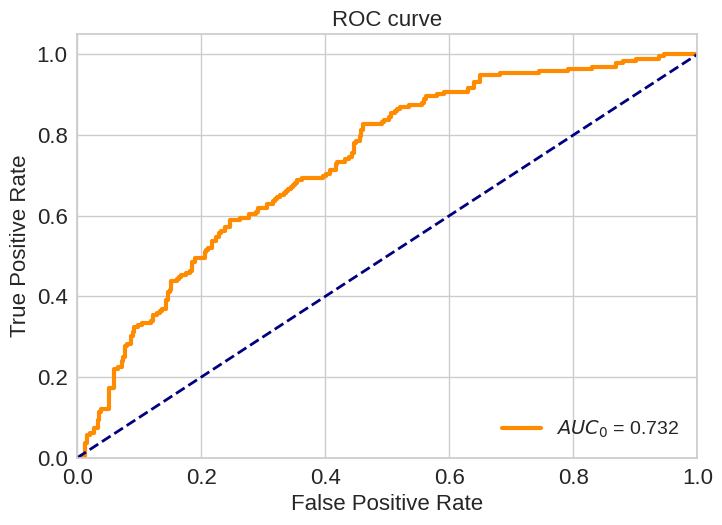

____________________________________
****** VALORE DI AUC *******
0.7318018353174602
____________________________________
****** ROC CURVE: con metodo diretto *******


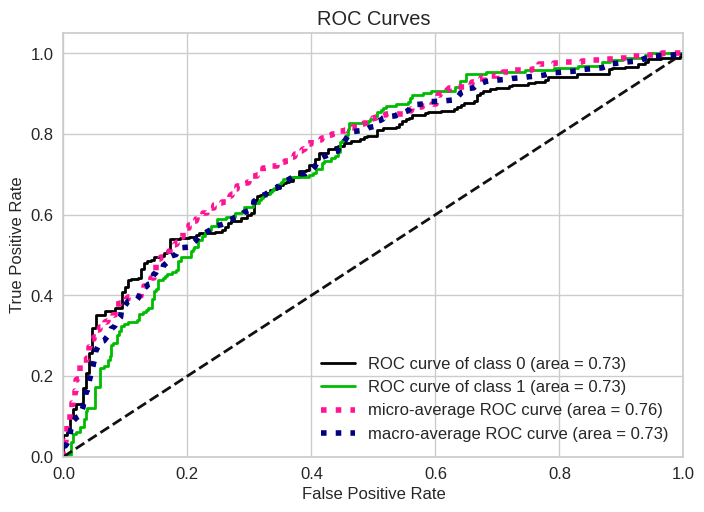

____________________________________
****** Precision recall: con metodo diretto *******


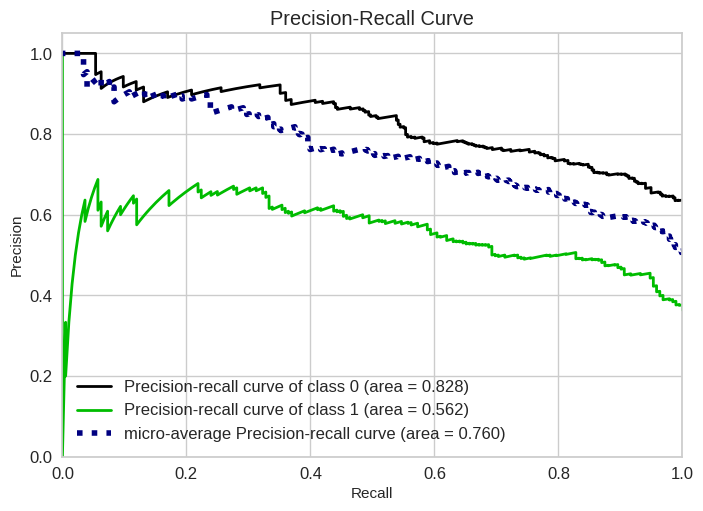

____________________________________
****** Cumulative gain: con metodo diretto *******


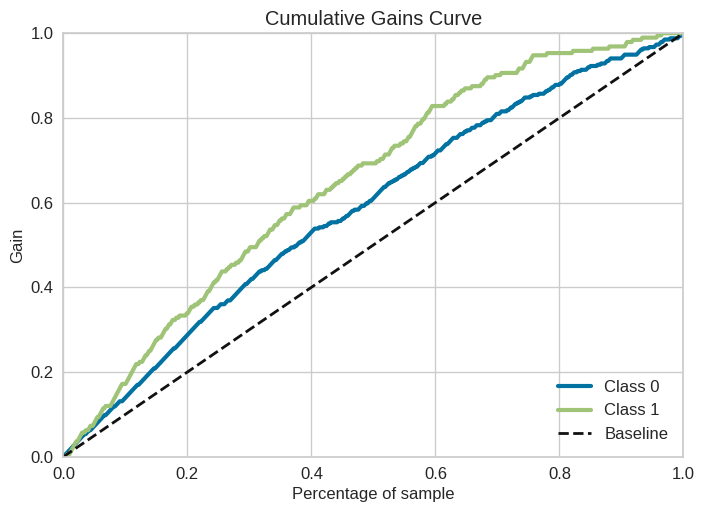

____________________________________
****** Lift curve: con metodo diretto *******


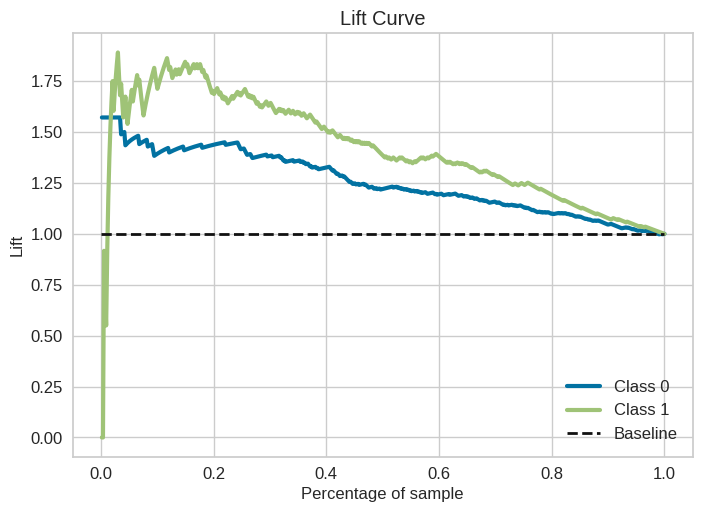

In [21]:
#{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100} --> con accuracy
clf = RandomForestClassifier(n_estimators = 100, criterion = 'gini', max_depth = 10, min_samples_leaf = 1, min_samples_split = 5)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
result_pred(y_test, y_pred)
y_score = clf.predict_proba(X_test)
plot_res(y_pred, y_score, y_test)

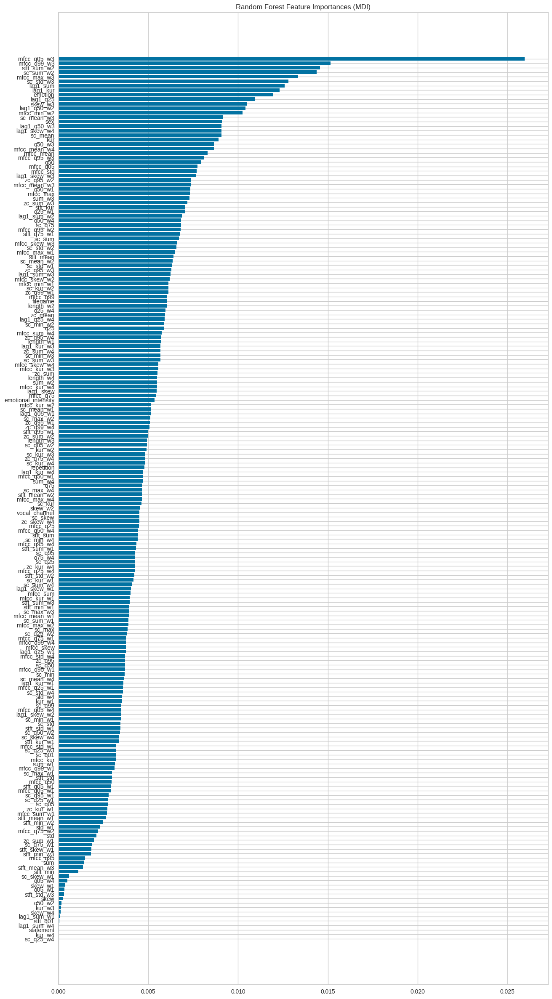

In [23]:
feature_names = df_train_final.columns
nbr_features = 205
tree_feature_importances = clf.feature_importances_
sorted_idx = tree_feature_importances.argsort()[-nbr_features:]

y_ticks = np.arange(0, len(sorted_idx))
fig, ax = plt.subplots(figsize=(15,30))
plt.barh(y_ticks, tree_feature_importances[sorted_idx])
plt.yticks(y_ticks, np.array(feature_names)[sorted_idx])
plt.title("Random Forest Feature Importances (MDI)")
plt.show()

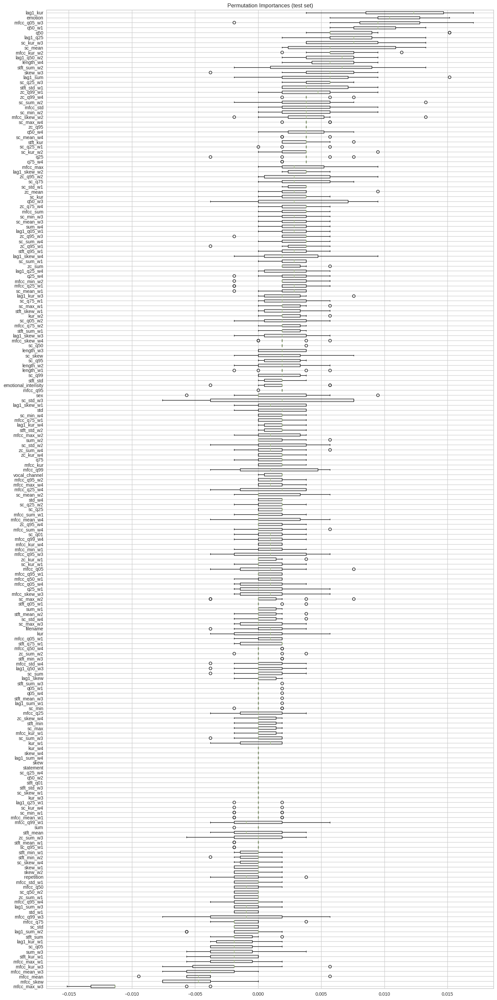

In [25]:
from sklearn.inspection import permutation_importance
result = permutation_importance(clf, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()[-nbr_features:]

fig, ax = plt.subplots(figsize=(15,30))
plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=np.array(feature_names)[sorted_idx])
plt.title("Permutation Importances (test set)")
plt.tight_layout()
plt.show()

In [26]:
import pydotplus
from sklearn import tree
from IPython.display import Image

In [39]:
df_appoggio = df_train_final.drop(columns=['vocal_channel', 'emotion', 'emotional_intensity', 'statement', 'repetition', 'sex', 'filename', 'positive'], axis = 1)

primo albero della foresta che si è creato con il modello ensemble

In [40]:
clf.estimators_[0]

DecisionTreeClassifier(max_depth=10, max_features='sqrt', min_samples_split=5,
                       random_state=1529578568)

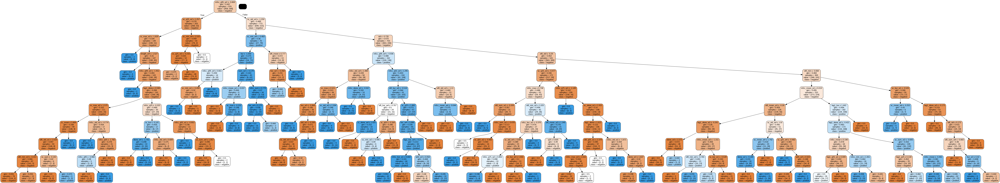

In [59]:
dot_data = tree.export_graphviz(clf.estimators_[0], out_file=None,  
                                feature_names=df_appoggio.columns, 
                                class_names=['negative', 'positive'],  
                                filled=True, rounded=True,  
                                special_characters=True, max_depth=10)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

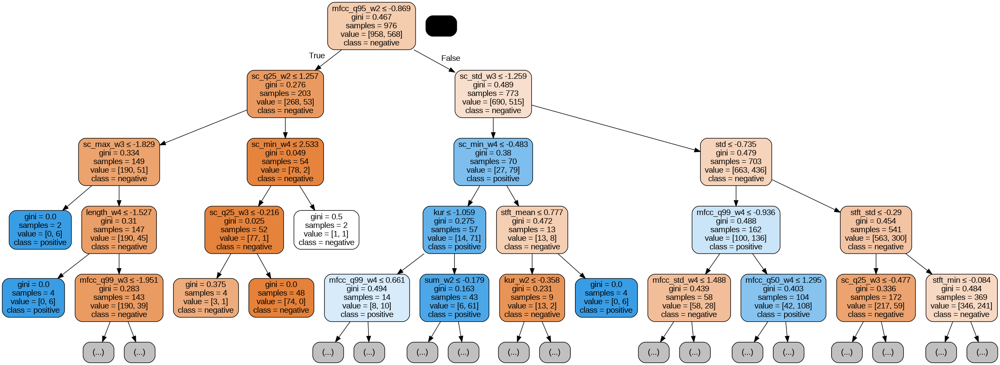

In [58]:
dot_data = tree.export_graphviz(clf.estimators_[0], out_file=None,  
                                feature_names=df_appoggio.columns, 
                                class_names=['negative', 'positive'],  
                                filled=True, rounded=True,  
                                special_characters=True, max_depth=4)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [49]:
df_train_final['positive'].head() #1 sarebbe positive, 0 negative

4    1
5    1
6    1
7    1
8    1
Name: positive, dtype: int64

secondo albero della foresta che si è creato con il modello ensemble

In [43]:
clf.estimators_[1]

DecisionTreeClassifier(max_depth=10, max_features='sqrt', min_samples_split=5,
                       random_state=2026406921)

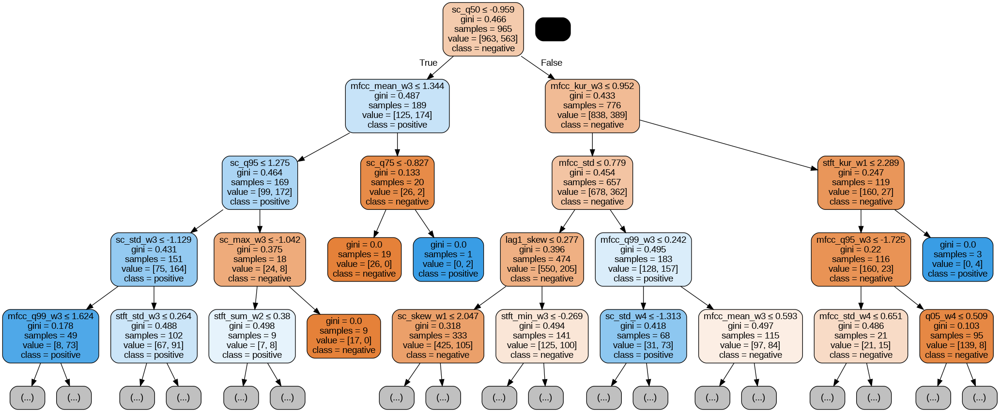

In [60]:
dot_data = tree.export_graphviz(clf.estimators_[1], out_file=None,  
                                feature_names=df_appoggio.columns, 
                                class_names=['negative', 'positive'],  
                                filled=True, rounded=True,  
                                special_characters=True, max_depth=4)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

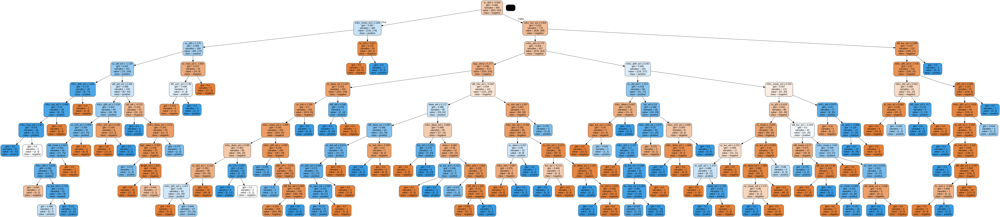

In [62]:
dot_data = tree.export_graphviz(clf.estimators_[1], out_file=None,  
                                feature_names=df_appoggio.columns, 
                                class_names=['negative', 'positive'],  
                                filled=True, rounded=True,  
                                special_characters=True, max_depth=10)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

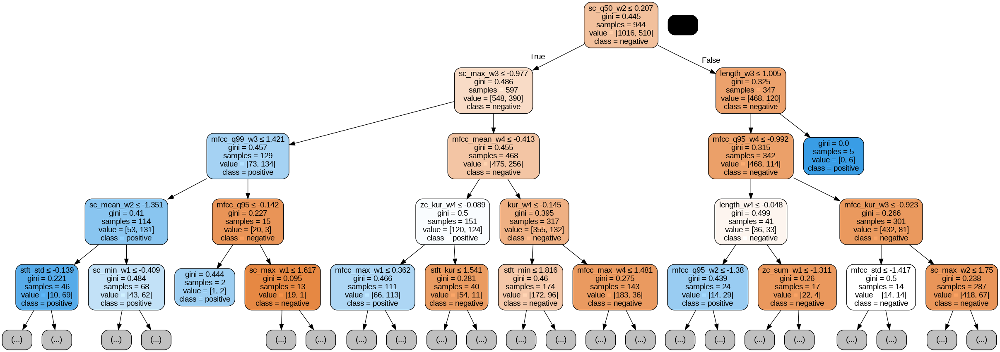

In [65]:
dot_data = tree.export_graphviz(clf.estimators_[2], out_file=None,  
                                feature_names=df_appoggio.columns, 
                                class_names=['negative', 'positive'],  
                                filled=True, rounded=True,  
                                special_characters=True, max_depth=4)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())